In [2]:
#Imports
import pandas as pd 
import json
import numpy as np 
import matplotlib.pyplot as plt 
%matplotlib inline

import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import plot 

from plotly.offline import download_plotlyjs, init_notebook_mode,plot , iplot 
init_notebook_mode(connected=True)

In [4]:
#Lecture des données
tunisian_stock_market = 'Tunisian-Stock-Market.json'
with open(tunisian_stock_market, 'r') as json_file:
    
    json_data = json.load(json_file)
TunisianStockMarket = pd.DataFrame(json_data)

In [5]:
#Choix d'une seule action(BNA dans notre cas)
TunisianStockMarket['Date'] = pd.to_datetime(TunisianStockMarket['Date'])
bna_data = TunisianStockMarket[TunisianStockMarket['Stock_name'] == 'BNA']

In [4]:
#Filtrage des colonnes non utile
columnsToExclude = ['Code_isin','Stock_name']
TunisianStockMarketFiltred = bna_data.drop(columns=columnsToExclude)
print(TunisianStockMarketFiltred)

            Date  Adj_Close  Adj_low  Adj_High       Volume
1     2021-11-04      2.790     2.65      2.81  5435.029785
80    2021-11-03      2.810     2.81      2.92  2385.739990
159   2021-11-02      2.810     2.81      2.90  6943.240234
238   2021-11-01      2.890     2.81      2.90  2797.209961
317   2021-10-29      2.900     2.81      2.94  2197.229980
...          ...        ...      ...       ...          ...
93092 2017-03-21      2.813     0.00      0.00     0.000000
93173 2017-03-17      2.813     0.00      0.00     0.000000
93254 2017-03-16      2.813     0.00      0.00     0.000000
93335 2017-03-15      2.813     0.00      0.00     0.000000
93416 2017-03-14      2.813     0.00      0.00     0.000000

[1156 rows x 5 columns]


In [5]:
#Voir les infos 
TunisianStockMarketFiltred.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1156 entries, 1 to 93416
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       1156 non-null   datetime64[ns]
 1   Adj_Close  1156 non-null   float64       
 2   Adj_low    1156 non-null   float64       
 3   Adj_High   1156 non-null   float64       
 4   Volume     1156 non-null   float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 54.2+ KB


In [6]:
print(f'Dataframe contains stock prices between {TunisianStockMarketFiltred.Date.min()} {TunisianStockMarketFiltred.Date.max()}')
print(f'Total days = {(TunisianStockMarketFiltred.Date.max() - TunisianStockMarketFiltred.Date.min()).days} days')

Dataframe contains stock prices between 2017-03-14 00:00:00 2021-11-04 00:00:00
Total days = 1696 days


In [7]:
TunisianStockMarket.describe()

,Date,Adj_Close,Adj_low,Adj_High,Volume
count,198886,198886.000000,198886.000000,198886.000000,1.988860e+05
mean,2016-10-09 15:32:00.678177280,12.679675,9.189997,9.310731,8.916077e+04
min,2011-01-03 00:00:00,0.140000,0.000000,0.000000,0.000000e+00
25%,2014-04-29 00:00:00,2.842000,1.090000,1.112000,1.620150e+02
50%,2016-11-28 00:00:00,5.549000,3.858000,3.927000,7.528120e+03
75%,2019-05-10 00:00:00,12.792000,8.670000,8.819750,4.143344e+04
max,2021-11-04 00:00:00,288.182000,288.182000,288.182000,8.025903e+08
std,NaN,22.289993,19.787656,19.991189,2.173860e+06


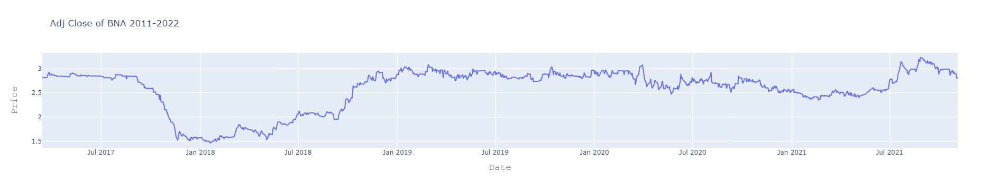

In [8]:
#Plot of close price 
layout = go.Layout(
    title = 'Adj Close of BNA 2011-2022',
    xaxis=dict(
        title='Date',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='Price',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)

Bna_data_for_plot = [{'x':TunisianStockMarketFiltred['Date'],'y':TunisianStockMarketFiltred['Adj_Close']}]
plot = go.Figure(data=Bna_data_for_plot, layout = layout)
iplot(plot)

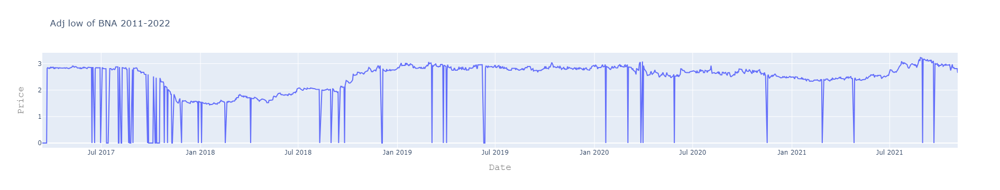

In [9]:
#Plot of close price 
layout = go.Layout(
    title = 'Adj low of BNA 2011-2022',
    xaxis=dict(
        title='Date',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='Price',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)

Bna_data_for_plot = [{'x':TunisianStockMarketFiltred['Date'],'y':TunisianStockMarketFiltred['Adj_low']}]
plot = go.Figure(data=Bna_data_for_plot, layout = layout)
iplot(plot)

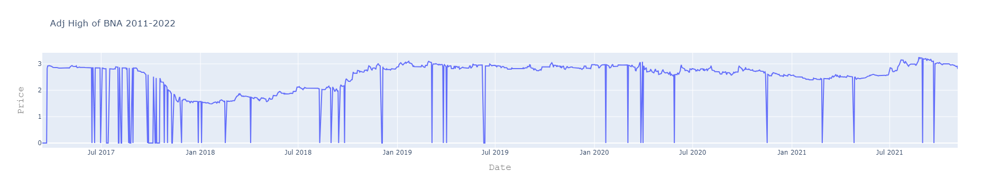

In [10]:
#Plot of close price 
layout = go.Layout(
    title = 'Adj High of BNA 2011-2022',
    xaxis=dict(
        title='Date',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='Price',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)

Bna_data_for_plot = [{'x':TunisianStockMarketFiltred['Date'],'y':TunisianStockMarketFiltred['Adj_High']}]
plot = go.Figure(data=Bna_data_for_plot, layout = layout)
iplot(plot)

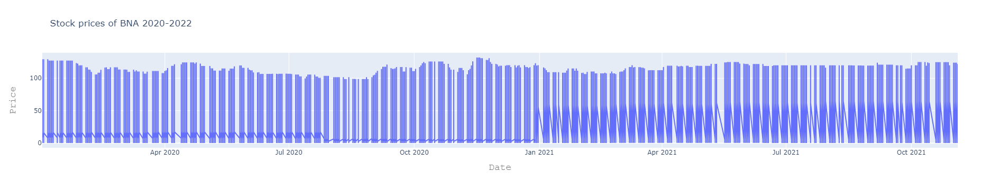

In [11]:
#Plot of close price 
layout = go.Layout(
    title = 'Stock prices of BNA 2020-2022',
    xaxis=dict(
        title='Date',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    ),
    yaxis=dict(
        title='Price',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)
TunisianStockMarketTimeFilter = TunisianStockMarket[TunisianStockMarket['Date'].dt.year.isin([2020, 2021])]
Bna_data_for_plot2 = [{'x':TunisianStockMarketTimeFilter['Date'],'y':TunisianStockMarketTimeFilter['Adj_Close']}]
plot = go.Figure(data=Bna_data_for_plot2, layout = layout)
iplot(plot)

In [12]:
#Regression model
from sklearn.model_selection import train_test_split

#For preprocessing 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

#For model evaluation
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score


In [13]:
#Split data train and test

X = np.array(TunisianStockMarketTimeFilter.index).reshape(-1,1)
Y = TunisianStockMarketTimeFilter['Adj_Close']
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=101)
print(X_train.T[0])

['13459' '23730' '36019' ... '8006' '17745' '17931']


In [14]:
#Scaler 
scaler = StandardScaler().fit(X_train)

In [15]:
#Import Linear Regression
from sklearn.linear_model import LinearRegression

In [16]:
#Creating a linear model
lm = LinearRegression()
lm.fit(X_train,Y_train)

LinearRegression()

In [17]:



dates = pd.to_datetime(TunisianStockMarketTimeFilter['Date'])

#Plot actual and predicted values
trace0 = go.Scatter(
    x = dates,
    y = Y_train,
    mode = 'markers',
    name = 'Actual'
)
trace1 = go.Scatter(
    x = dates,
    y = lm.predict(X_train).T,
    mode = 'lines',
    name = 'Predicted'
)
TunisianStockMarket_data = [trace0,trace1]
layout = go.Layout(xaxis=dict(title='Date'))
                   
plot2 = go.Figure(data = TunisianStockMarket_data , layout = layout)


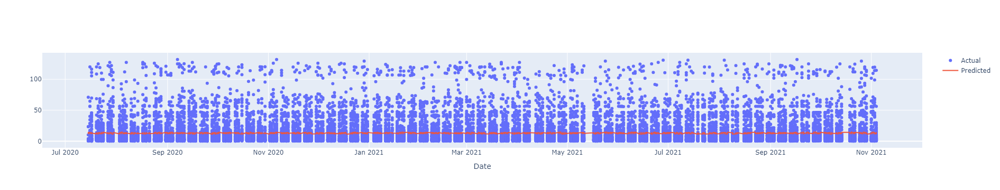

In [18]:
#Affichage Courbe
iplot(plot2)

In [19]:
#calculate scores for model evaluation
scores = f'''
{'Metric'.ljust(10)}{'Train'.center(20)}{'Test'.center(20)}
{'r2_score'.ljust(10)}{r2_score(Y_train, lm.predict(X_train))}\t{r2_score(Y_test, lm.predict(X_test))}
{'MSE'.ljust(10)}{mse(Y_train,lm.predict(X_train))}\t{mse(Y_test, lm.predict(X_test))}
'''
print(scores)


Metric           Train                Test        
r2_score  0.0025035055829816244	0.0023651456090634237
MSE       402.8027345469547	405.5839827625187



In [41]:
#Testing with other parameters and inputs
from sklearn.impute import SimpleImputer
# Example feature engineering
TunisianStockMarketTimeFilter.loc[:, 'Daily_Return'] = TunisianStockMarketTimeFilter['Adj_Close'].pct_change()
TunisianStockMarketTimeFilter.loc[:, 'SMA_10'] = TunisianStockMarketTimeFilter['Adj_Close'].rolling(window=10).mean()
TunisianStockMarketTimeFilter.loc[:, 'SMA_20'] = TunisianStockMarketTimeFilter['Adj_Close'].rolling(window=20).mean()
TunisianStockMarketTimeFilter.loc[:, 'SMA_50'] = TunisianStockMarketTimeFilter['Adj_Close'].rolling(window=50).mean()
#TunisianStockMarketTimeFilter.loc[:, 'SMA_180'] = TunisianStockMarketTimeFilter['Adj_Close'].rolling(window=180).mean()
#TunisianStockMarketTimeFilter.loc[:, 'SMA_365'] = TunisianStockMarketTimeFilter['Adj_Close'].rolling(window=365).mean()
TunisianStockMarketTimeFilter.loc[:, 'Volume_Shock'] = (TunisianStockMarketTimeFilter['Volume'] > TunisianStockMarketTimeFilter['Volume'].shift()).astype(int)


features = ['Adj_low', 'Adj_High', 'Volume', 'Daily_Return','SMA_10', 'SMA_20', 'SMA_50', 'Volume_Shock']
X = TunisianStockMarketTimeFilter[features]

Y = TunisianStockMarketTimeFilter[['Adj_Close']]
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,random_state=0)

imputer_X = SimpleImputer(strategy='mean')
X_train = pd.DataFrame(imputer_X.fit_transform(X_train), columns=X_train.columns)

# Create a separate imputer instance for Y_train
imputer_Y = SimpleImputer(strategy='mean')
Y_train = pd.DataFrame(imputer_Y.fit_transform(Y_train), columns=Y_train.columns)

# Transform the test set using the imputers fitted on the training set
X_test = pd.DataFrame(imputer_X.transform(X_test), columns=X_test.columns)

# Normalize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [21]:
X_train.shape

(27420, 8)

In [22]:
X_test.shape

(9140, 8)

In [23]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
regressor = LinearRegression()

In [24]:
LinearRegression(copy_X =True,fit_intercept=True,n_jobs=None)

LinearRegression()

In [25]:
regressor.fit(X_train,Y_train)

LinearRegression()

In [26]:
print(regressor.coef_)

[[16.63590675 -4.0274603   0.07690644  3.50994519  8.36761715 -3.51277845
  -1.54847995 -3.52039729]]


In [27]:
print(regressor.intercept_)

[12.90401958]


In [28]:
PredictedValues=regressor.predict(X_test)
PredictedValues[PredictedValues < 0] = 0

In [29]:
print(X_test)

[[ 0.87759069  0.92948796 -0.0548757  ...  0.53078958 -0.82214283
   1.05528224]
 [-0.25175414 -0.25312072 -0.04627081 ... -0.70794881  0.40282802
   1.05528224]
 [-0.50758494 -0.5095843  -0.05722276 ... -0.09012129 -1.22783125
  -0.94761379]
 ...
 [-0.26530168 -0.26252838 -0.04111411 ... -0.98000469 -1.88176093
  -0.94761379]
 [-0.32136673 -0.3163378  -0.04872962 ... -0.07963547  1.55016661
   1.05528224]
 [-0.47553049 -0.47782596 -0.05700516 ... -0.84302267  0.64307412
   1.05528224]]


In [30]:
PredictedValues.shape
mse = mean_squared_error(Y_test, PredictedValues)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 140.3586508323016


In [31]:
DataFrameTest = pd.DataFrame({'Actual': Y_test.values.flatten(), 'Predicted Values': PredictedValues.flatten()})

In [32]:
print(DataFrameTest)

      Actual  Predicted Values
0     23.898         23.087959
1      4.230          0.564931
2      1.526         17.747608
3      3.303          2.568072
4      8.238          1.285617
...      ...               ...
9135   2.980          3.904440
9136  23.760         33.119965
9137   4.025         12.373089
9138   3.098          0.000000
9139   0.530          0.000000

[9140 rows x 2 columns]


In [33]:
from sklearn.metrics import confusion_matrix , accuracy_score , mean_absolute_error
regressor.score(X_test,Y_test)

0.6499097761371653

In [34]:
import math

In [35]:
print('Mean absolute Error :', mean_absolute_error(Y_test,PredictedValues))

Mean absolute Error : 6.6588171924655875


In [36]:
print('Mean squared Error :', mean_squared_error(Y_test,PredictedValues))

Mean squared Error : 140.3586508323016


In [37]:
print('Root Mean Squared Error :', math.sqrt(mean_absolute_error(Y_test,PredictedValues)))

Root Mean Squared Error : 2.5804684056321223


In [38]:
Graph = DataFrameTest.head(25)
Graph2 = DataFrameTest.head(100)

<Axes: >

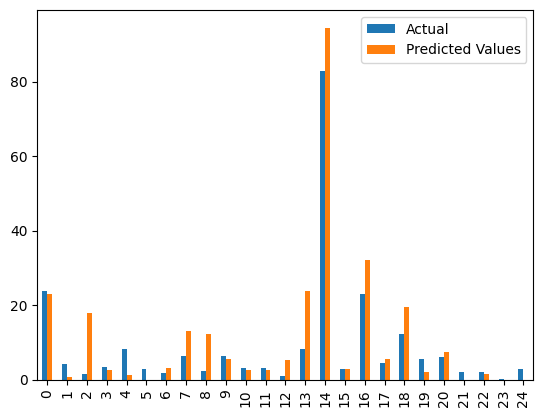

In [39]:
Graph.plot(kind='bar')

<Axes: >

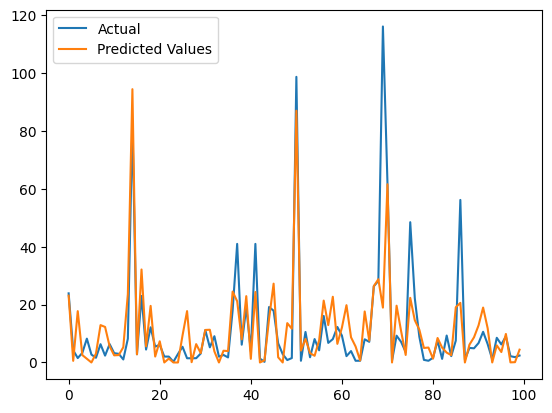

In [40]:
Graph2.plot(kind='line')

In [44]:
print('Mean squared Error :', mean_squared_error(Y_test,PredictedValues))
print('R2 : ' ,regressor.score(X_test,Y_test))

Mean squared Error : 140.3586508323016
R2 :  0.6499097761371653
